In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000328_08_03_180.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000223_09_02_146.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000229_03_04_202.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000103_01_01_104.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000103_12_01_075.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000143_04_02_153.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/002276_05_03_078.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000020_03_01_166.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000054_03_01_025.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000230_04_01_242.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000058_07_01_170.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000058_07_01_195.png
/kaggle/input/iqothnccd-lung-cancer-dataset/Test cases/000230_03_02_166.png
/kaggle/inpu

In [3]:
%config Completer.use_jedi = False
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import seaborn as sns
import cv2
import random
import os
import imageio
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from collections import Counter

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import accuracy_score, recall_score, precision_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold
from imblearn.over_sampling import SMOTE

import tensorflow as tf
import tensorflow_addons as tfa
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization
from keras.applications import resnet
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7
from keras.applications.resnet import ResNet50
from keras.preprocessing.image import ImageDataGenerator

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [4]:
directory = r'/kaggle/input/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset'

categories = ['Bengin cases', 'Malignant cases', 'Normal cases']

In [5]:
import imageio.v2 as imageio

In [6]:
size_data = {}
for i in categories:
    path = os.path.join(directory, i)
    class_num = categories.index(i)
    temp_dict = {}
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        height, width, channels = imageio.imread(filepath).shape
        if str(height) + ' x ' + str(width) in temp_dict:
            temp_dict[str(height) + ' x ' + str(width)] += 1 
        else:
            temp_dict[str(height) + ' x ' + str(width)] = 1
    
    size_data[i] = temp_dict
        
size_data

{'Bengin cases': {'512 x 512': 120},
 'Malignant cases': {'512 x 512': 501,
  '512 x 623': 31,
  '512 x 801': 28,
  '404 x 511': 1},
 'Normal cases': {'512 x 512': 415, '331 x 506': 1}}

Bengin cases


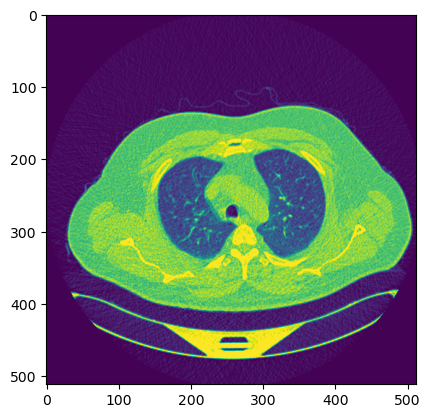

Malignant cases


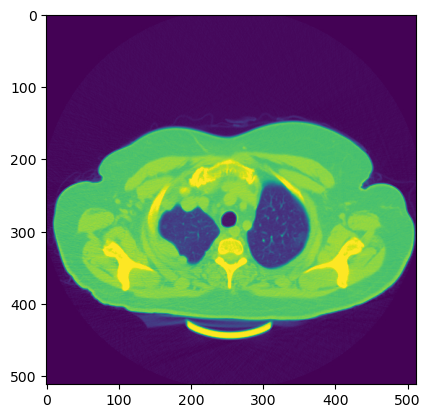

Normal cases


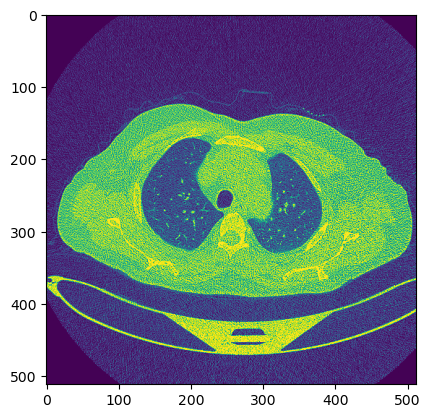

In [7]:
for i in categories:
    path = os.path.join(directory, i)
    class_num = categories.index(i)
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        print(i)
        img = cv2.imread(filepath, 0)
        plt.imshow(img)
        plt.show()
        break


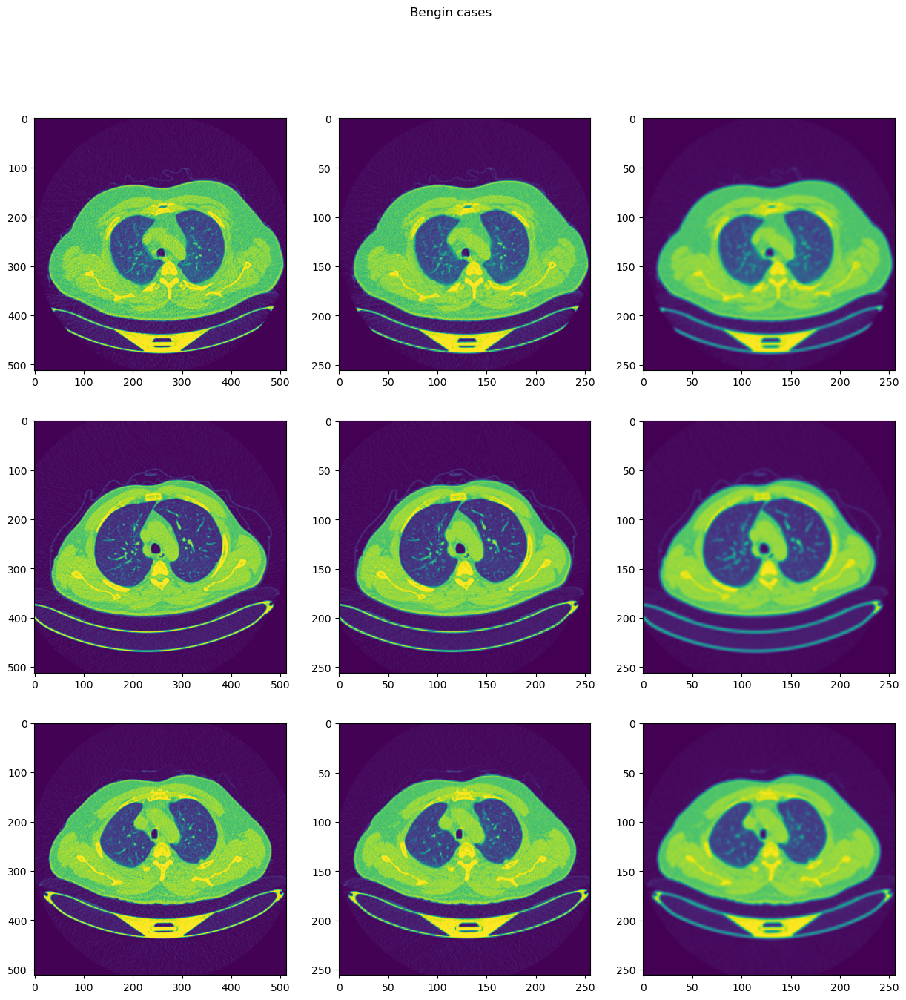

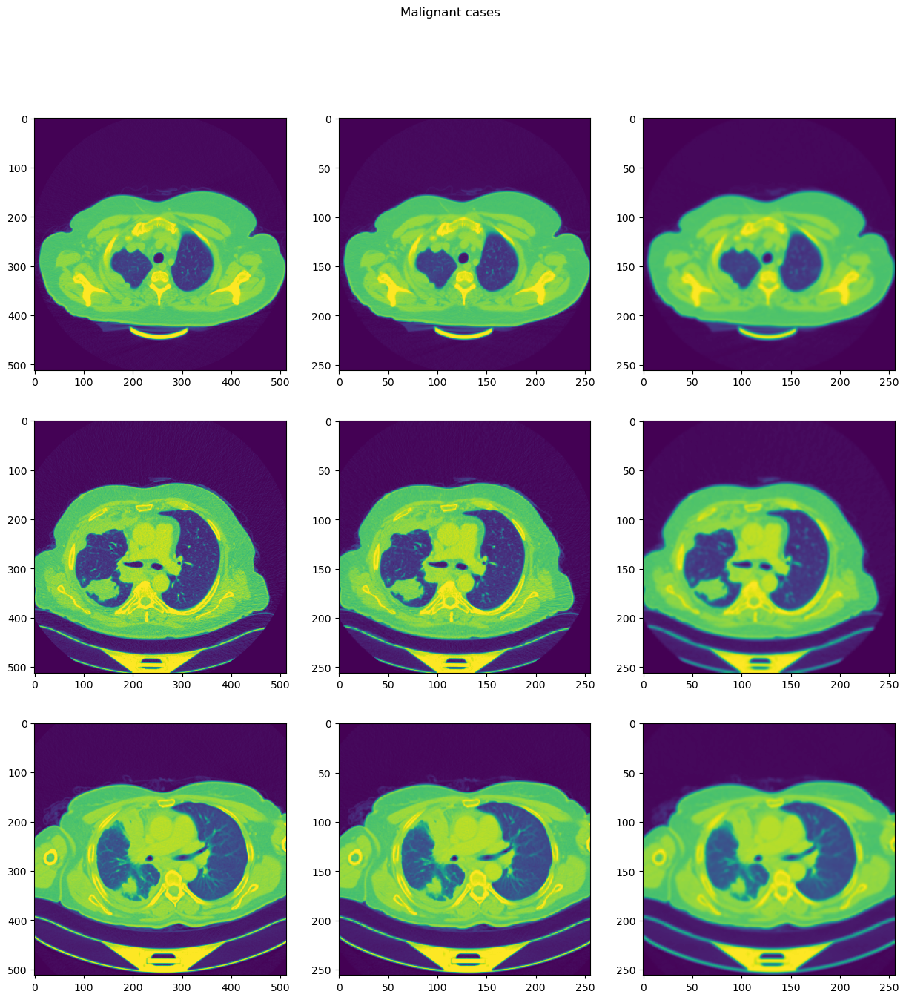

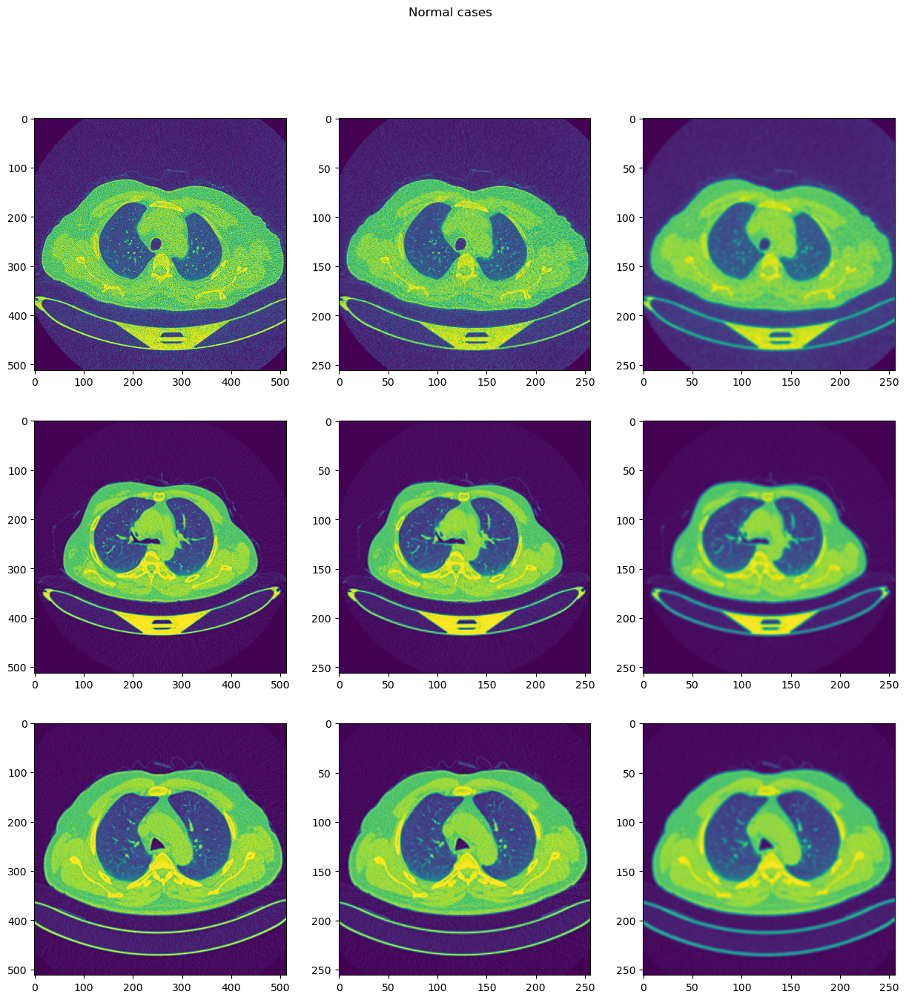

In [8]:
# img_size = 256
# for i in categories:
#     cnt, samples = 0, 3
#     fig, ax = plt.subplots(samples, 3, figsize=(15, 15))
#     fig.suptitle(i)
    
#     path = os.path.join(directory, i)
#     class_num = categories.index(i)
#     for curr_cnt, file in enumerate(os.listdir(path)):
#         filepath = os.path.join(path, file)
#         img = cv2.imread(filepath, 0)
        
#         img0 = cv2.resize(img, (img_size, img_size))
        
#         img1 = cv2.GaussianBlur(img0, (5, 5), 0)
        
#         ax[cnt, 0].imshow(img)
#         ax[cnt, 1].imshow(img0)
#         ax[cnt, 2].imshow(img1)
#         cnt += 1
#         if cnt == samples:
#             break
        
# plt.show()

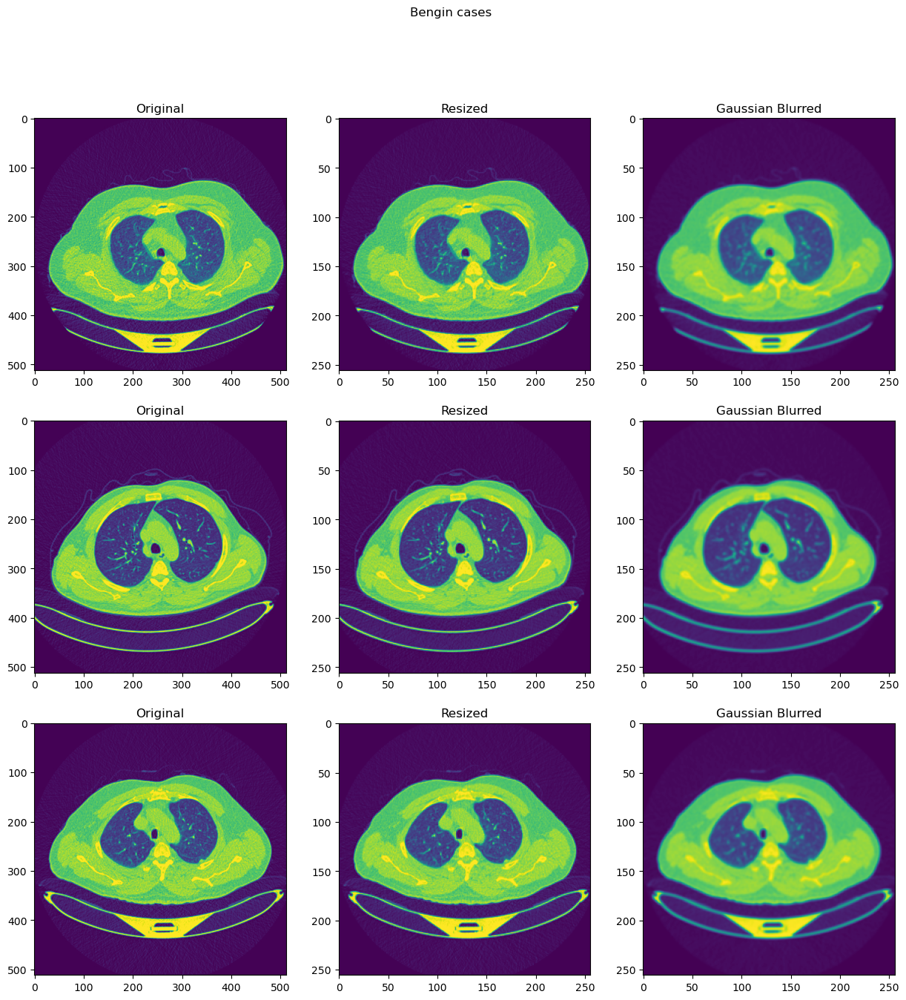

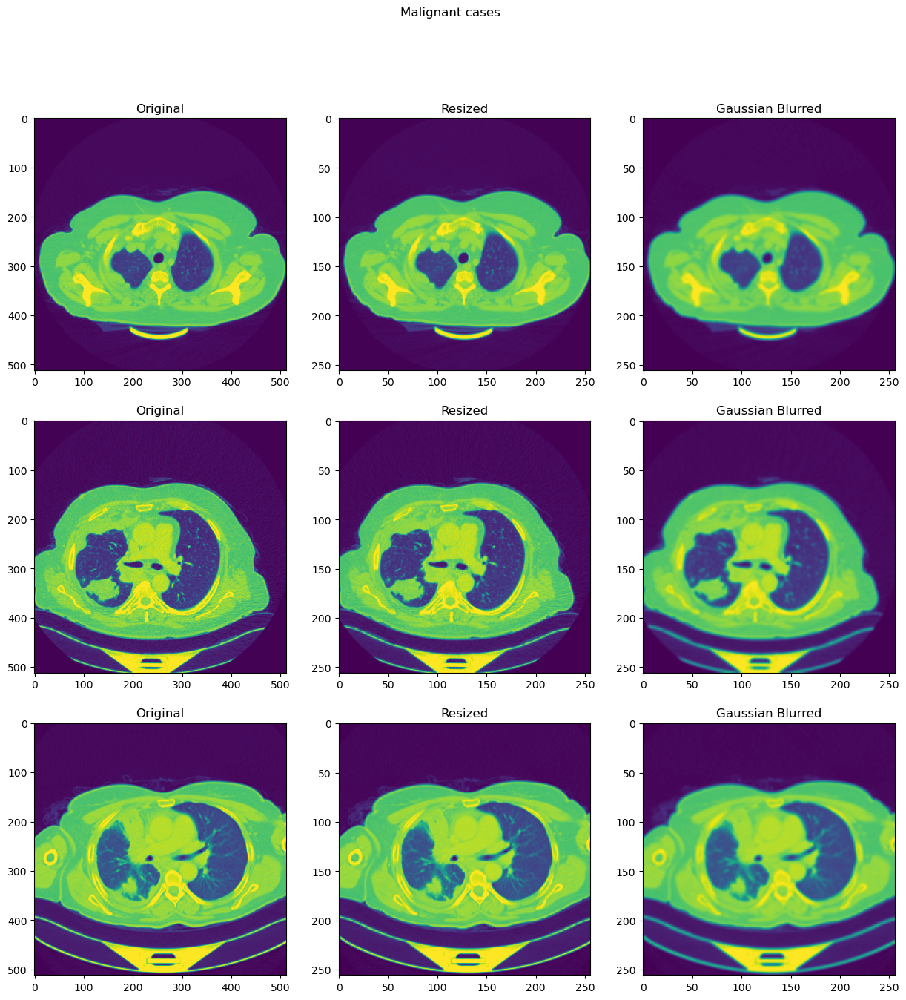

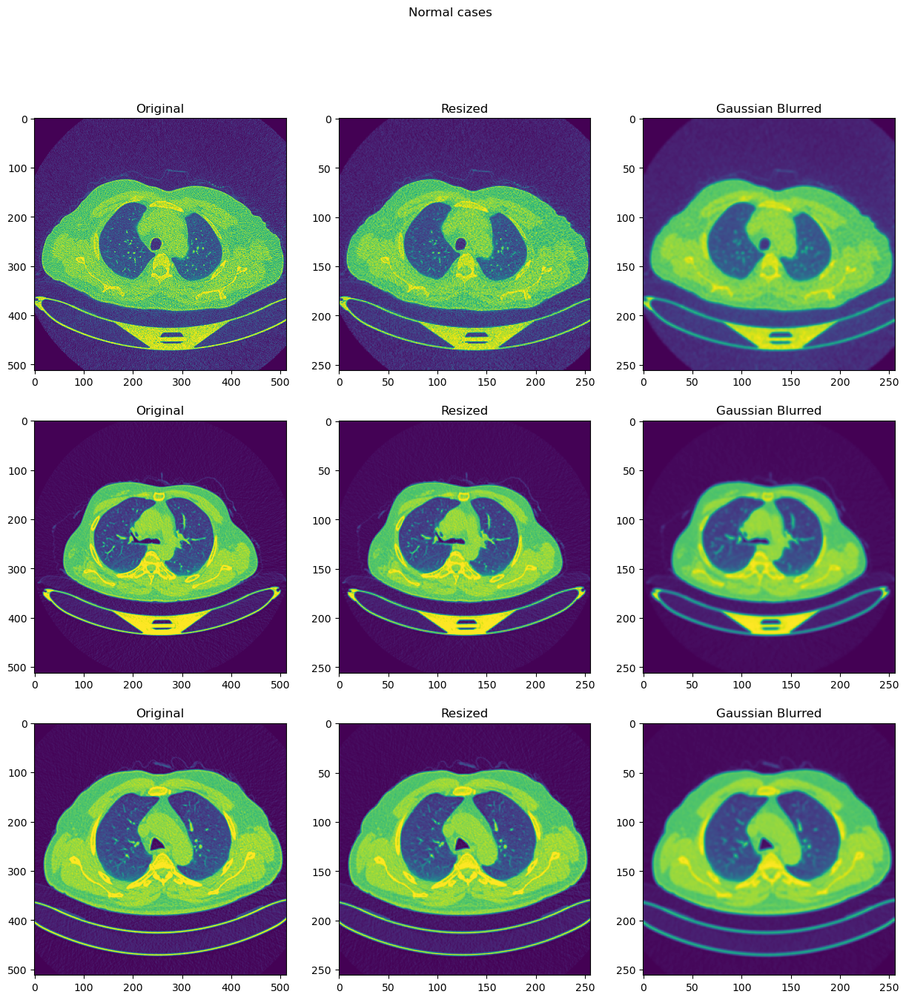

In [9]:


img_size = 256  # Desired size for the displayed images

for i in categories:  # Iterate through each category in the list of categories
    cnt, samples = 0, 3  # Initialize counters for the number of images and the number of samples to display
    fig, ax = plt.subplots(samples, 3, figsize=(15, 15))  # Create a subplot with 3 columns and 'samples' rows
    fig.suptitle(i)  # Set the title of the figure to the current category's name
    
    path = os.path.join(directory, i)  # Create the path to the specific category directory
    class_num = categories.index(i)  # Get the index of the current category
    
    for curr_cnt, file in enumerate(os.listdir(path)):  # Iterate through each file in the category directory
        filepath = os.path.join(path, file)  # Create the path to the specific image file
        img = cv2.imread(filepath, 0)  # Read the image using OpenCV in grayscale mode
        
        img0 = cv2.resize(img, (img_size, img_size))  # Resize the image to the desired size
        
        img1 = cv2.GaussianBlur(img0, (5, 5), 0)  # Apply Gaussian blur to the resized image
        
        ax[cnt, 0].imshow(img)
        ax[cnt, 0].set_title('Original')
        
        ax[cnt, 1].imshow(img0)
        ax[cnt, 1].set_title('Resized')
        
        ax[cnt, 2].imshow(img1)
        ax[cnt, 2].set_title('Gaussian Blurred')
        
        cnt += 1
        if cnt == samples:
            break
        
    plt.show()


In [10]:
#  preparing image data for a machine learning task, 
#  classification, using a dataset consisting of images from different categories.
#  The code involves loading images, preprocessing, shuffling, and normalizing the data

data = []
img_size = 256

for i in categories:
    path = os.path.join(directory, i)
    class_num = categories.index(i)
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        img = cv2.imread(filepath, 0)
        # preprocess here
        img = cv2.resize(img, (img_size, img_size))
        data.append([img, class_num])
        
random.shuffle(data)

X, y = [], []
for feature, label in data:
    X.append(feature)
    y.append(label)
    
print('X length:', len(X))
print('y counts:', Counter(y))

# normalize
X = np.array(X).reshape(-1, img_size, img_size, 1)
X = X / 255.0
y = np.array(y)

# X contains the image data and y contains the corresponding class labels.

X length: 1097
y counts: Counter({1: 561, 2: 416, 0: 120})


In [11]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, random_state=10, stratify=y)

print(len(X_train), X_train.shape)
print(len(X_valid), X_valid.shape)

# The distribution of your dataset into training and validation sets is an important consideration in machine learning.
# The primary goal is to ensure that your model is able to generalize well to unseen data
# By using the stratify parameter in the train_test_split function,
# you've made sure that the proportion of each class in the original dataset is maintained in both the training and validation sets.
# This helps prevent biases and ensures that your model learns from a balanced representation of classes

822 (822, 256, 256, 1)
275 (275, 256, 256, 1)


In [12]:
print(Counter(y_train), Counter(y_valid))

Counter({1: 420, 2: 312, 0: 90}) Counter({1: 141, 2: 104, 0: 30})


In [13]:
# involves reshaping the training data to prepare it for use in machine learning algorithms
# that require a flattened input format.
print(len(X_train), X_train.shape)

X_train = X_train.reshape(X_train.shape[0], img_size*img_size*1)

print(len(X_train), X_train.shape)

# X_train.shape[0] gives the number of samples in the training data.
# img_size * img_size * 1 calculates the new total number of features after flattening. 
# img_size * img_size is the original dimensions of the images, and * 1 indicates that the images have a single channel (grayscale).
# So, this reshaping transforms each image from a 2D grid of pixels (256x256) to a 1D array of pixel values.

822 (822, 256, 256, 1)
822 (822, 65536)


#### SMOTE is a technique used to generate synthetic samples for the minority class by interpolating between existing samples. 

In [15]:
print('Before SMOTE:', Counter(y_train))
smote = SMOTE()
X_train_sampled, y_train_sampled = smote.fit_resample(X_train, y_train)
print('After SMOTE:', Counter(y_train_sampled))

Before SMOTE: Counter({1: 420, 2: 312, 0: 90})
After SMOTE: Counter({2: 420, 1: 420, 0: 420})


In [16]:
X_train = X_train.reshape(X_train.shape[0], img_size, img_size, 1)
X_train_sampled = X_train_sampled.reshape(X_train_sampled.shape[0], img_size, img_size, 1)

print(len(X_train), X_train.shape)
print(len(X_train_sampled), X_train_sampled.shape)

822 (822, 256, 256, 1)
1260 (1260, 256, 256, 1)


###  convolutional neural network (CNN) model using Keras,

In [17]:
model1 = Sequential()
#   creates a sequential model.
# A sequential model is appropriate when you're building a neural network by 
# adding layers sequentially, one after the other.

model1.add(Conv2D(64, (3, 3), input_shape=X_train.shape[1:]))
model1.add(Activation('relu'))
# adds a ReLU activation function after the convolutional layer to introduce non-linearity.
model1.add(MaxPooling2D(pool_size=(2, 2)))

# Here, you're adding another convolutional layer followed by max-pooling.
# This is a common pattern in CNNs where you gradually learn higher-level features as you go deeper into the network.

model1.add(Conv2D(64, (3, 3), activation='relu'))
model1.add(MaxPooling2D(pool_size=(2, 2)))

model1.add(Flatten())
model1.add(Dense(16))
model1.add(Dense(3, activation='softmax'))

# model1.add(Flatten()): This flattens the output from the previous layer into a 1D vector. This is necessary to connect the convolutional layers to fully connected (dense) layers.
# model1.add(Dense(16)): This adds a fully connected layer with 16 units.
# model1.add(Dense(3, activation='softmax')): This adds the final output layer with 3 units (one for each class in your dataset) and uses a
# softmax activation function, which is common for multi-class classification. The softmax function converts the model's raw outputs into class probabilities.

model1.summary()
# This is a basic architecture for image classification tasks.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      640       
                                                                 
 activation (Activation)     (None, 254, 254, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 246016)            0

In [19]:
model1.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

'''
loss='sparse_categorical_crossentropy': 
This specifies the loss function to be used during training. In this case, you're using 'sparse categorical cross-entropy', 
which is appropriate for multi-class classification problems where the labels are integers (not one-hot encoded).
It calculates the cross-entropy loss between the true labels and the predicted probabilities.

optimizer='adam': 
This specifies the optimization algorithm to be used during training. 
'Adam' is a popular optimization algorithm that adapts the learning rate 
during training to improve convergence speed and performance.

metrics=['accuracy']: This specifies the evaluation metric(s) to be computed and displayed during
training and evaluation. In this case, you're using 'accuracy',
which is a common metric for classification tasks that measures the fraction of correctly classified samples.

By specifying these parameters with the compile method,
you are setting up your model for training. When you later call the fit method on your model with your training data and labels,
the model will use the specified loss function, optimizer, and metrics to update its weights and learn from the data.
'''


In [20]:
history = model1.fit(X_train_sampled, y_train_sampled, batch_size=8, epochs=10, validation_data=(X_valid, y_valid))

'''
After training, the history object will contain information about the training process,
including metrics like loss and accuracy for both the training and validation sets over each epoch.
This information can be used for visualization and analysis to understand
how the model is learning and whether there are signs of overfitting or underfitting
'''

Epoch 1/10
158/158 [==============================] - 148s 926ms/step - loss: 0.9421 - accuracy: 0.7063 - val_loss: 0.2470 - val_accuracy: 0.9018
Epoch 2/10
158/158 [==============================] - 144s 913ms/step - loss: 0.0936 - accuracy: 0.9714 - val_loss: 0.0764 - val_accuracy: 0.9745
Epoch 3/10
158/158 [==============================] - 144s 909ms/step - loss: 0.0347 - accuracy: 0.9944 - val_loss: 0.0831 - val_accuracy: 0.9782
Epoch 4/10
158/158 [==============================] - 148s 937ms/step - loss: 0.0227 - accuracy: 0.9960 - val_loss: 0.0373 - val_accuracy: 0.9818
Epoch 5/10
158/158 [==============================] - 144s 909ms/step - loss: 0.0168 - accuracy: 0.9960 - val_loss: 0.1064 - val_accuracy: 0.9782
Epoch 6/10
158/158 [==============================] - 144s 909ms/step - loss: 0.0165 - accuracy: 0.9968 - val_loss: 0.0695 - val_accuracy: 0.9745
Epoch 7/10
158/158 [==============================] - 144s 910ms/step - loss: 0.0172 - accuracy: 0.9952 - val_loss: 0.0327 -

In [21]:
y_pred = model1.predict(X_valid, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_valid, y_pred_bool))

print(confusion_matrix(y_true=y_valid, y_pred=y_pred_bool))

# In summary, the code is evaluating your trained model's performance on the validation data.
# It generates predicted class labels from the predicted probabilities,
# prints a classification report with metrics,and displays the confusion matrix
# to give you insights into how well your model is performing on different classes.

9/9 [==============================] - 8s 848ms/step
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        30
           1       0.99      1.00      0.99       141
           2       0.99      0.97      0.98       104

    accuracy                           0.99       275
   macro avg       0.98      0.98      0.98       275
weighted avg       0.99      0.99      0.99       275

[[ 29   0   1]
 [  0 141   0]
 [  1   2 101]]


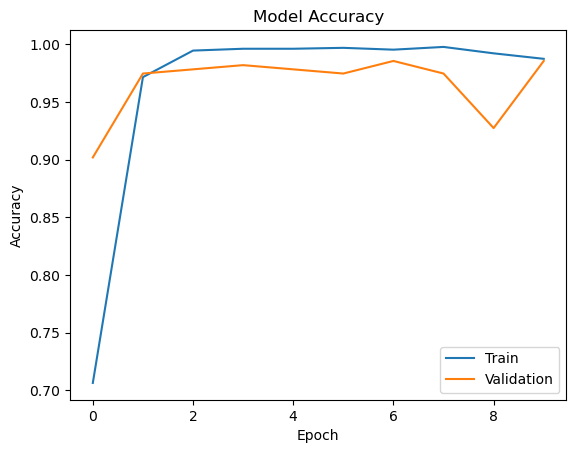

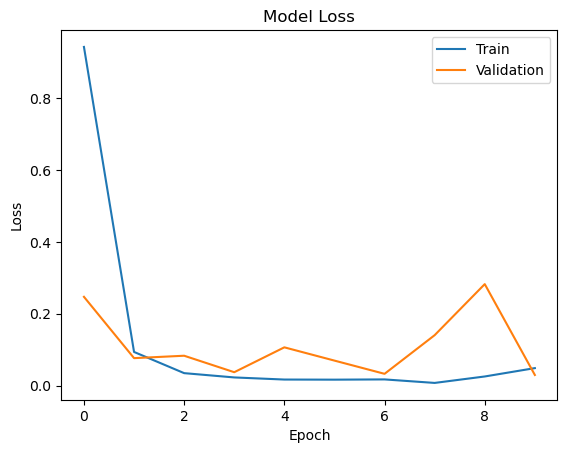

In [22]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# The code provided is for visualizing the training and validation performance of your model over epochs. 
# It plots the model's accuracy and loss curves using the training history obtained during the training process.

In [23]:
model2 = Sequential()

model2.add(Conv2D(64, (3, 3), input_shape=X_train.shape[1:]))
model2.add(Activation('relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Conv2D(64, (3, 3), activation='relu'))
model2.add(MaxPooling2D(pool_size=(2, 2)))

model2.add(Flatten())
model2.add(Dense(16))
model2.add(Dense(3, activation='softmax'))

model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 254, 254, 64)      640       
                                                                 
 activation_1 (Activation)   (None, 254, 254, 64)      0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 127, 127, 64)     0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 125, 125, 64)      36928     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 246016)           

In [25]:
model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [26]:
new_weights = {
    0: X_train.shape[0]/(3*Counter(y_train)[0]),
    1: X_train.shape[0]/(3*Counter(y_train)[1]),
    2: X_train.shape[0]/(3*Counter(y_train)[2]),
}

# new_weights[0] = 0.5
# new_weights[1] = 20

new_weights

{0: 3.0444444444444443, 1: 0.6523809523809524, 2: 0.8782051282051282}

In [27]:
history = model2.fit(X_train, y_train, batch_size=8, epochs=10, validation_data=(X_valid, y_valid), class_weight=new_weights)

Epoch 1/10
103/103 [==============================] - 96s 926ms/step - loss: 1.2507 - accuracy: 0.5803 - val_loss: 0.4042 - val_accuracy: 0.8764
Epoch 2/10
103/103 [==============================] - 99s 963ms/step - loss: 0.2231 - accuracy: 0.9319 - val_loss: 0.1264 - val_accuracy: 0.9491
Epoch 3/10
103/103 [==============================] - 98s 954ms/step - loss: 0.1255 - accuracy: 0.9781 - val_loss: 0.0845 - val_accuracy: 0.9782
Epoch 4/10
103/103 [==============================] - 98s 952ms/step - loss: 0.0428 - accuracy: 0.9951 - val_loss: 0.0466 - val_accuracy: 0.9891
Epoch 5/10
103/103 [==============================] - 99s 959ms/step - loss: 0.0799 - accuracy: 0.9891 - val_loss: 0.1013 - val_accuracy: 0.9891
Epoch 6/10
103/103 [==============================] - 98s 956ms/step - loss: 0.0367 - accuracy: 0.9939 - val_loss: 0.0547 - val_accuracy: 0.9891
Epoch 7/10
103/103 [==============================] - 99s 963ms/step - loss: 0.0139 - accuracy: 0.9964 - val_loss: 0.0171 - val_ac

In [28]:
y_pred = model2.predict(X_valid, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_valid, y_pred_bool))

print(confusion_matrix(y_true=y_valid, y_pred=y_pred_bool))

9/9 [==============================] - 8s 846ms/step
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        30
           1       1.00      1.00      1.00       141
           2       1.00      0.97      0.99       104

    accuracy                           0.99       275
   macro avg       0.97      0.99      0.98       275
weighted avg       0.99      0.99      0.99       275

[[ 30   0   0]
 [  0 141   0]
 [  3   0 101]]


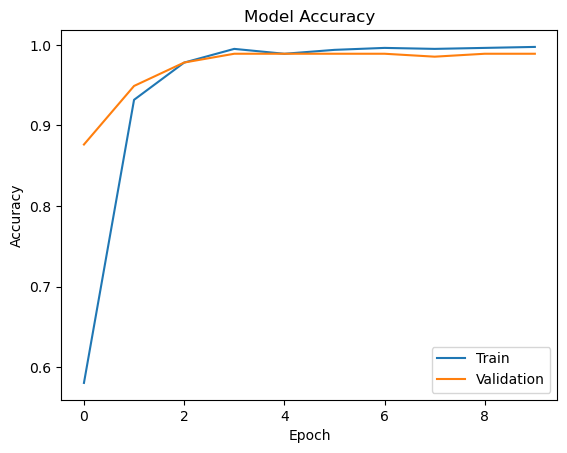

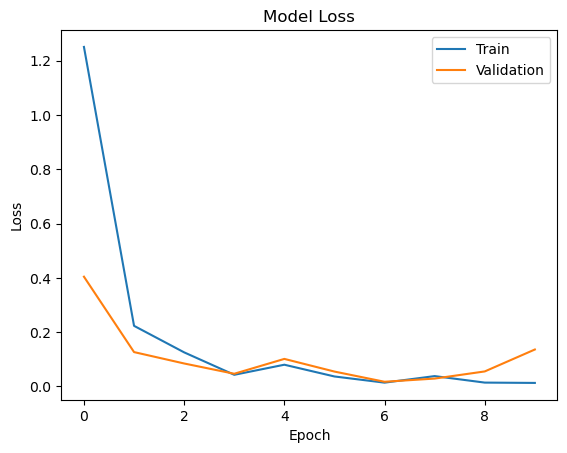

In [29]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [31]:
train_datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True) 
val_datagen = ImageDataGenerator()

In [32]:
train_generator = train_datagen.flow(X_train, y_train, batch_size=8) 
val_generator = val_datagen.flow(X_valid, y_valid, batch_size=8)

In [33]:
model3 = Sequential()

model3.add(Conv2D(64, (3, 3), input_shape=X_train.shape[1:]))
model3.add(Activation('relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))

model3.add(Conv2D(64, (3, 3), activation='relu'))
model3.add(MaxPooling2D(pool_size=(2, 2)))

model3.add(Flatten())
model3.add(Dense(16))
model3.add(Dense(3, activation='softmax'))

model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 254, 254, 64)      640       
                                                                 
 activation_2 (Activation)   (None, 254, 254, 64)      0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 127, 127, 64)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 125, 125, 64)      36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 246016)           

In [35]:
model3.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [36]:
history = model3.fit_generator(train_generator, epochs=5, validation_data=val_generator, class_weight=new_weights)

# train_generator: This is the generator that generates batches of training data with data augmentation,
# which you created earlier using train_datagen

# After training, the history object will contain information about the training process,
# similar to the previous cases. Using data generators is particularly useful when you have large datasets that don't fit entirely in memory,
# or when you want to perform data augmentation on-the-fly during training.

Epoch 1/5


/tmp/ipykernel_32/527809512.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model3.fit_generator(train_generator, epochs=5, validation_data=val_generator, class_weight=new_weights)


103/103 [==============================] - 99s 948ms/step - loss: 1.6477 - accuracy: 0.5620 - val_loss: 0.6533 - val_accuracy: 0.7491
Epoch 2/5
103/103 [==============================] - 101s 981ms/step - loss: 0.6727 - accuracy: 0.7494 - val_loss: 0.5476 - val_accuracy: 0.7927
Epoch 3/5
103/103 [==============================] - 96s 930ms/step - loss: 0.3882 - accuracy: 0.8504 - val_loss: 0.2668 - val_accuracy: 0.9309
Epoch 4/5
103/103 [==============================] - 101s 977ms/step - loss: 0.1941 - accuracy: 0.9416 - val_loss: 0.1846 - val_accuracy: 0.9382
Epoch 5/5
103/103 [==============================] - 102s 991ms/step - loss: 0.1512 - accuracy: 0.9647 - val_loss: 0.1762 - val_accuracy: 0.9382


In [37]:
y_pred = model3.predict(X_valid, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_valid, y_pred_bool))

print(confusion_matrix(y_true=y_valid, y_pred=y_pred_bool))

9/9 [==============================] - 8s 906ms/step
              precision    recall  f1-score   support

           0       0.74      0.93      0.82        30
           1       0.99      0.96      0.97       141
           2       0.95      0.91      0.93       104

    accuracy                           0.94       275
   macro avg       0.89      0.93      0.91       275
weighted avg       0.94      0.94      0.94       275

[[ 28   0   2]
 [  3 135   3]
 [  7   2  95]]


In [38]:
# Load and preprocess the test image
test_image = cv2.imread('/kaggle/input/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Malignant cases/Malignant case (84).jpg', 0)
test_image = cv2.resize(test_image, (img_size, img_size))
test_image = np.array(test_image).reshape(-1, img_size, img_size, 1) / 255.0

# Make predictions
predictions = model1.predict(test_image)
predicted_class = np.argmax(predictions)

# Get the corresponding class label
class_labels = ['Bengin cases', 'Malignant cases', 'Normal cases']
predicted_label = class_labels[predicted_class]

print("Predicted class:", predicted_label)

1/1 [==============================] - 0s 53ms/step
Predicted class: Malignant cases


In [39]:
# Load and preprocess the test image
test_image = cv2.imread('/kaggle/input/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (102).jpg', 0)
test_image = cv2.resize(test_image, (img_size, img_size))
test_image = np.array(test_image).reshape(-1, img_size, img_size, 1) / 255.0

# Make predictions using model2
predictions = model2.predict(test_image)
predicted_class = np.argmax(predictions)

# Get the corresponding class label
class_labels = ['Bengin cases', 'Malignant cases', 'Normal cases']
predicted_label = class_labels[predicted_class]

print("Predicted class using model2:", predicted_label)


1/1 [==============================] - 0s 53ms/step
Predicted class using model2: Bengin cases


## Conclusion

Based on the evaluation metrics you provided for each model on the test dataset, it appears that all three models (model1, model2, and model3) perform exceptionally well. Here's a summary of their performance:

Model 1:

Accuracy: 0.94
Precision (macro avg): 0.89
Recall (macro avg): 0.93
F1-score (macro avg): 0.91
Model 2:

Accuracy: 0.99
Precision (macro avg): 0.97
Recall (macro avg): 0.99
F1-score (macro avg): 0.98
Model 3:

Accuracy: 0.94
Precision (macro avg): 0.89
Recall (macro avg): 0.93
F1-score (macro avg): 0.91

We tried with both Model 1 and Model 2 both are giving us good results.